# 4.0 Modeling

In [79]:
import pandas as pd

import importlib
import sys

# setting path
sys.path.append('..')
# importing
from src.models import modeling
importlib.reload(modeling);

In [78]:
kmeans_all = pd.read_csv('../data/processed/kmeans_all_data.csv').drop('Unnamed: 0', axis=1, errors='ignore')
kmeans_high = pd.read_csv('../data/processed/kmeans_high_school.csv').drop('Unnamed: 0', axis=1, errors='ignore')

llm_all = pd.read_csv('../data/processed/llm_kmeans_all_data.csv').drop('Unnamed: 0', axis=1, errors='ignore')
llm_high = pd.read_csv('../data/processed/llm_kmeans_high_school.csv').drop('Unnamed: 0', axis=1, errors='ignore')

kprototypes_all = pd.read_csv('../data/processed/no_outliers_kmeans_all_data.csv')
kprototypes_high = pd.read_csv('../data/processed/no_outliers_kmeans_high_school.csv')

In [41]:
kmeans_all_modeler = modeling.KMeansSelector(kmeans_all)
kmeans_high_modeler = modeling.KMeansSelector(kmeans_high)

llm_all_modeler = modeling.KMeansSelector(llm_all)
llm_high_modeler = modeling.KMeansSelector(llm_high)

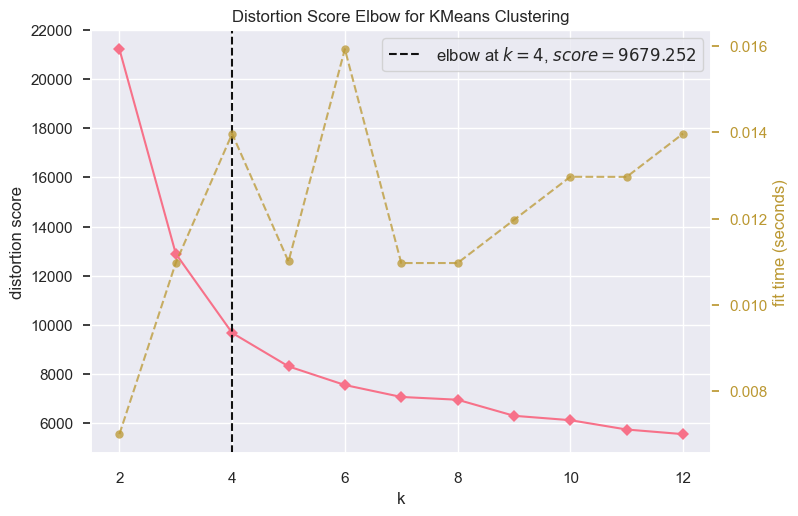

In [42]:
kmeans_all_modeler.show_elbow()

k=3
For n_clusters=3 The average silhouette score is 0.48585969955438163


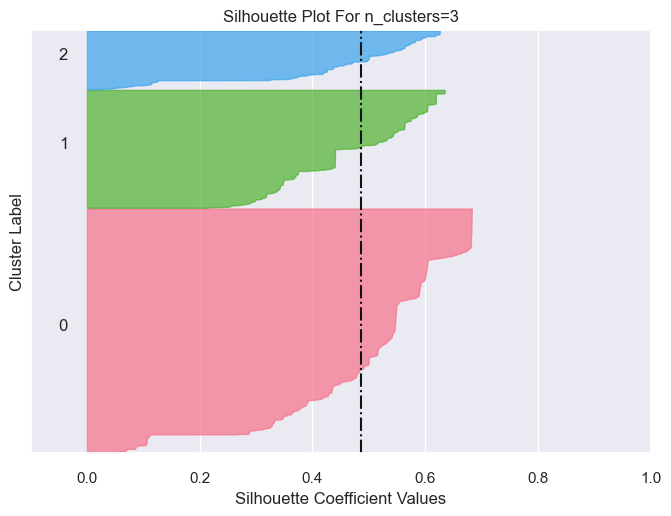

k=4
For n_clusters=4 The average silhouette score is 0.46608928320110987


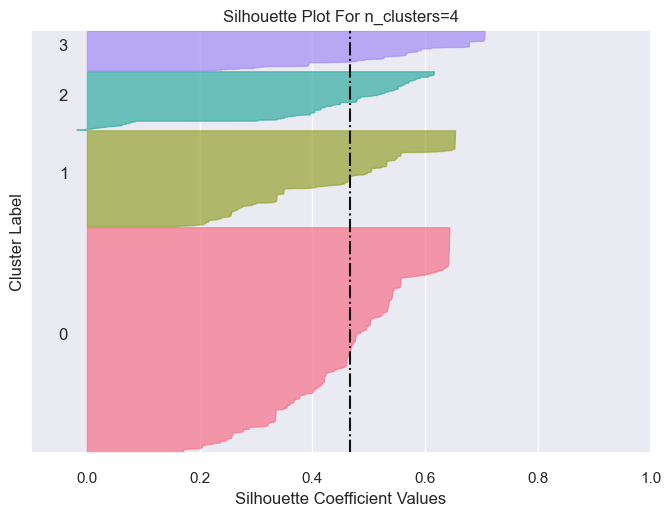

k=5
For n_clusters=5 The average silhouette score is 0.3569195992566749


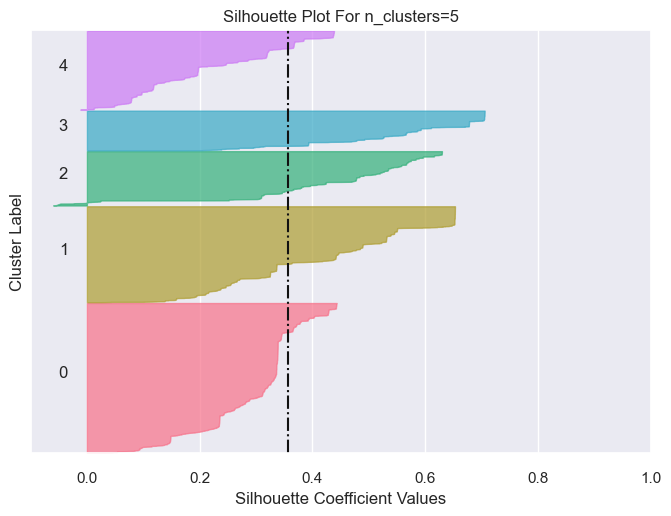

k=6
For n_clusters=6 The average silhouette score is 0.3420915849728551


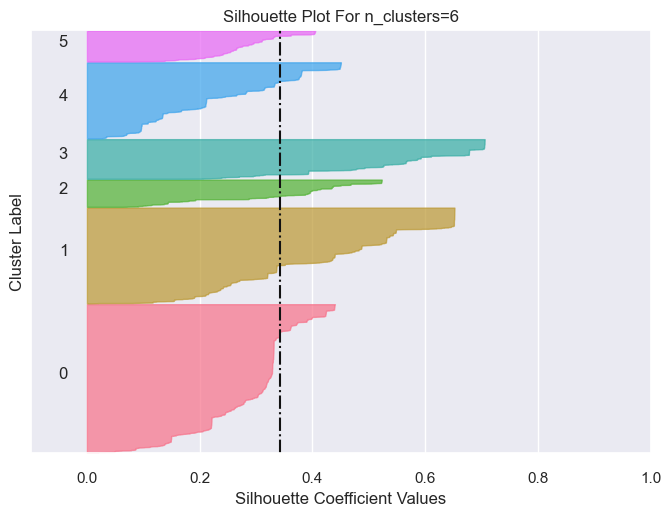

k=7
For n_clusters=7 The average silhouette score is 0.2995474714205773


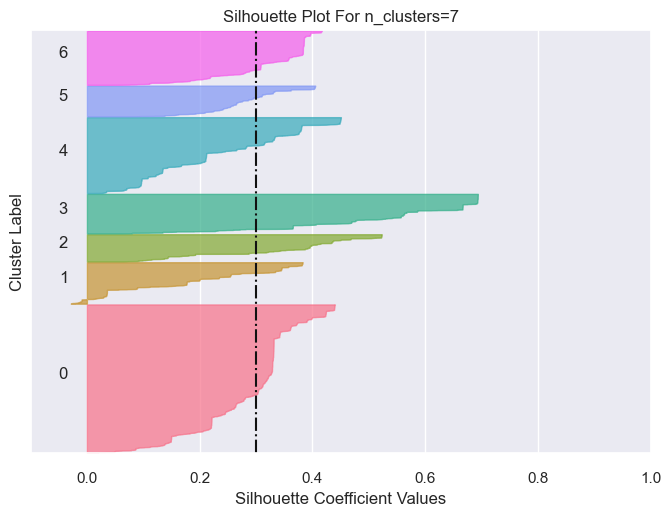

In [43]:
kmeans_all_modeler.show_silhouettes(3,8)

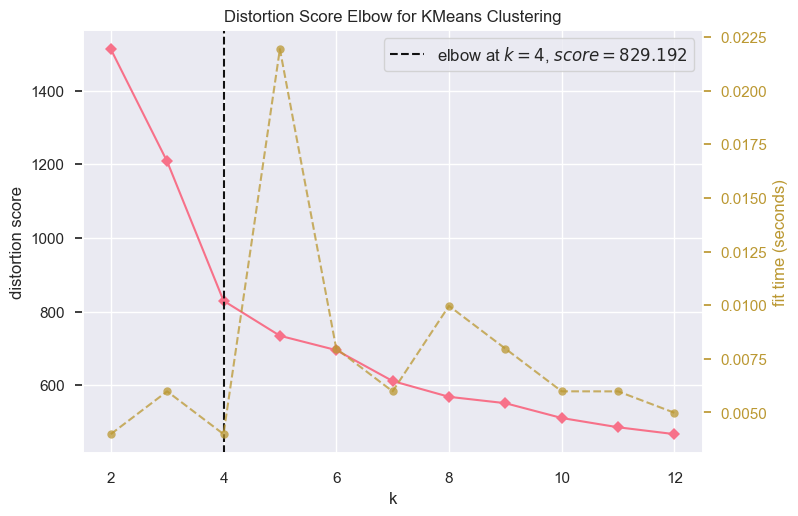

In [44]:
kmeans_high_modeler.show_elbow()

k=2
For n_clusters=2 The average silhouette score is 0.49584728026884367


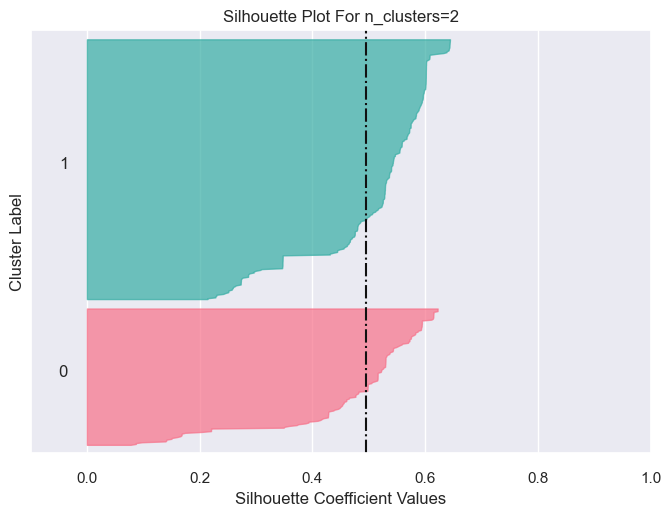

k=3
For n_clusters=3 The average silhouette score is 0.3504004259495459


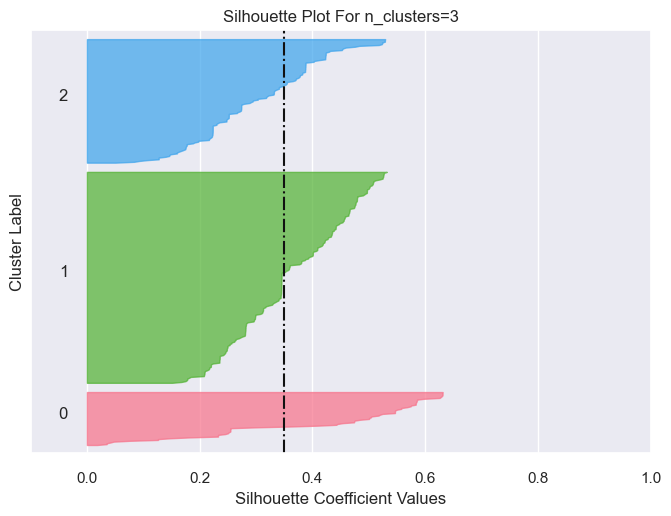

k=4
For n_clusters=4 The average silhouette score is 0.4272400246241571


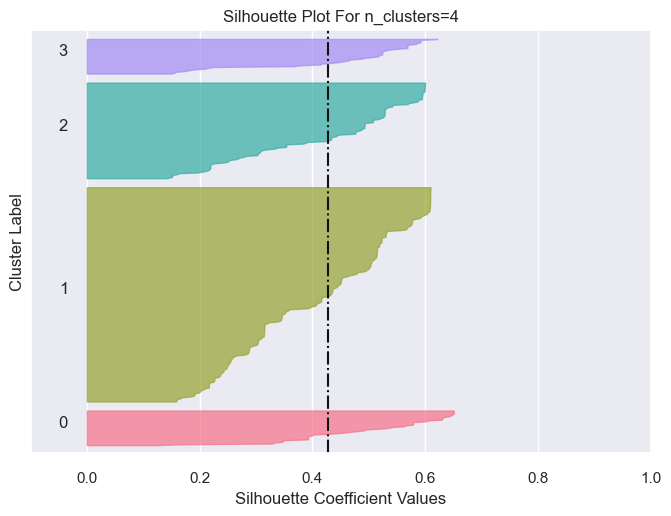

k=5
For n_clusters=5 The average silhouette score is 0.3039742874245962


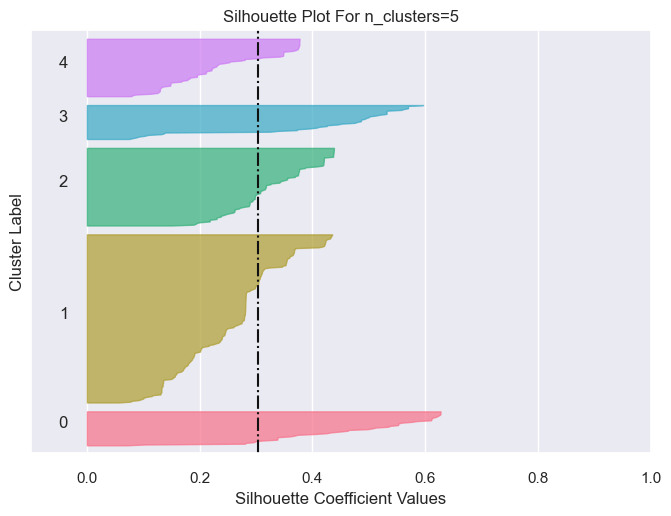

k=6
For n_clusters=6 The average silhouette score is 0.2858837251954019


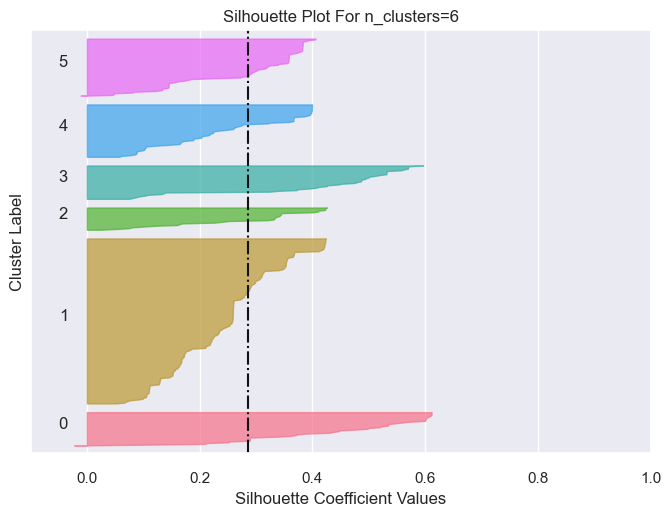

In [45]:
kmeans_high_modeler.show_silhouettes(2,7)

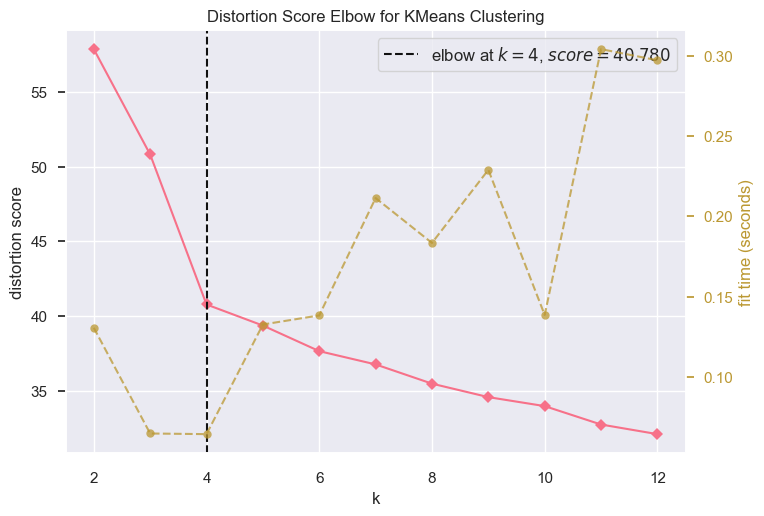

In [46]:
llm_all_modeler.show_elbow()

k=3
For n_clusters=3 The average silhouette score is 0.33315047953209925


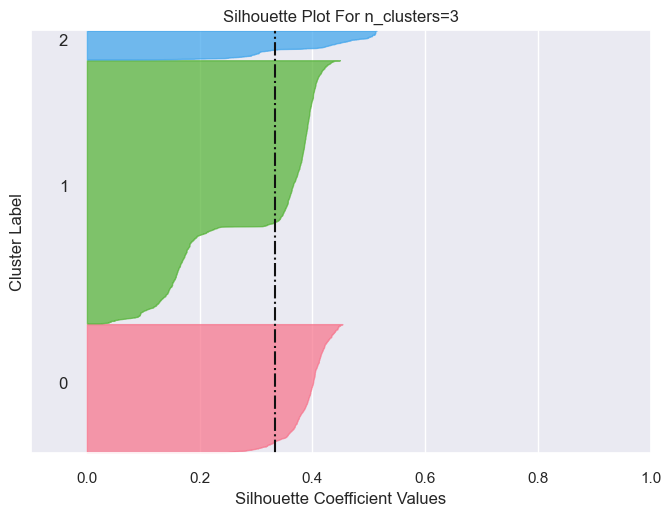

k=4
For n_clusters=4 The average silhouette score is 0.291112588123498


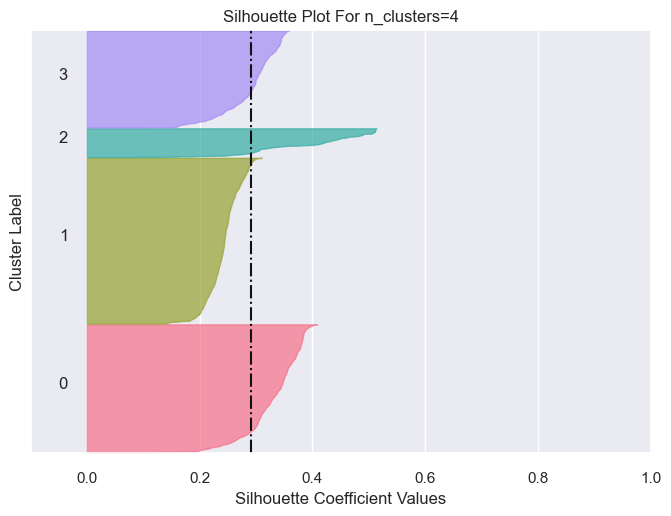

k=5
For n_clusters=5 The average silhouette score is 0.2264327756655076


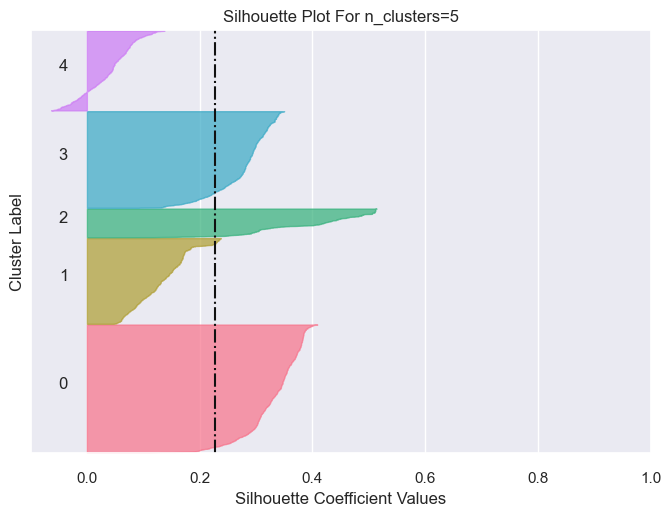

k=6
For n_clusters=6 The average silhouette score is 0.24535319438152445


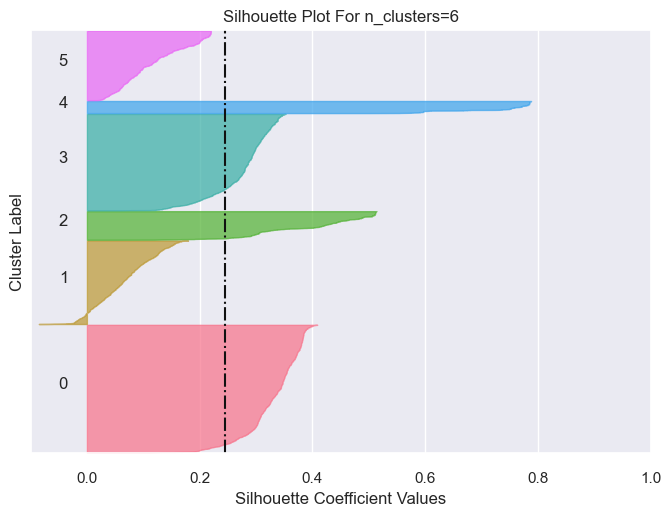

k=7
For n_clusters=7 The average silhouette score is 0.2082101435725894


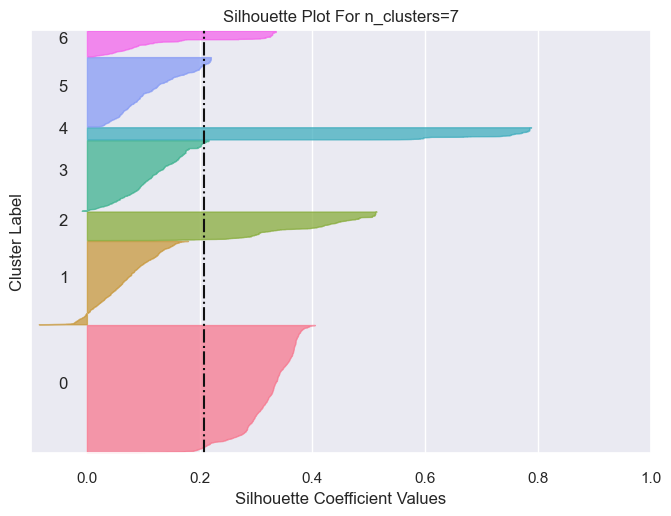

In [47]:
llm_all_modeler.show_silhouettes(3,8)

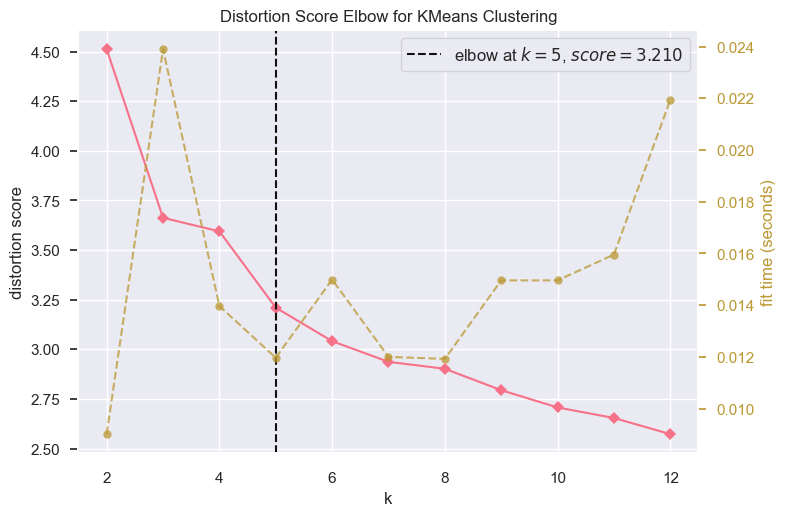

In [48]:
llm_high_modeler.show_elbow()

k=3
For n_clusters=3 The average silhouette score is 0.26771241504988624


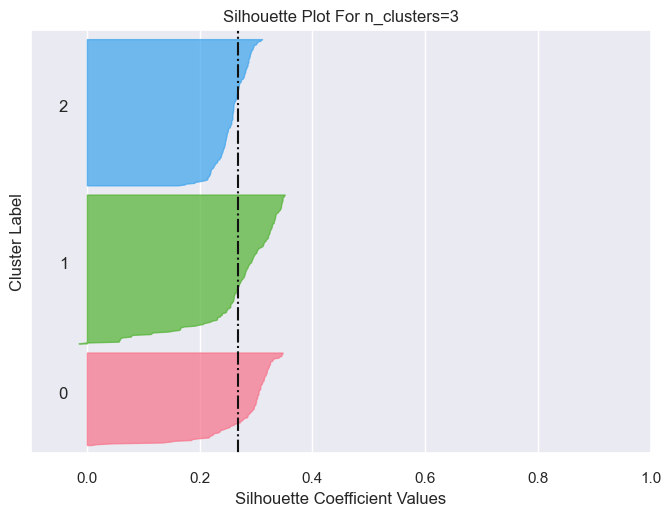

k=4
For n_clusters=4 The average silhouette score is 0.21697032379660516


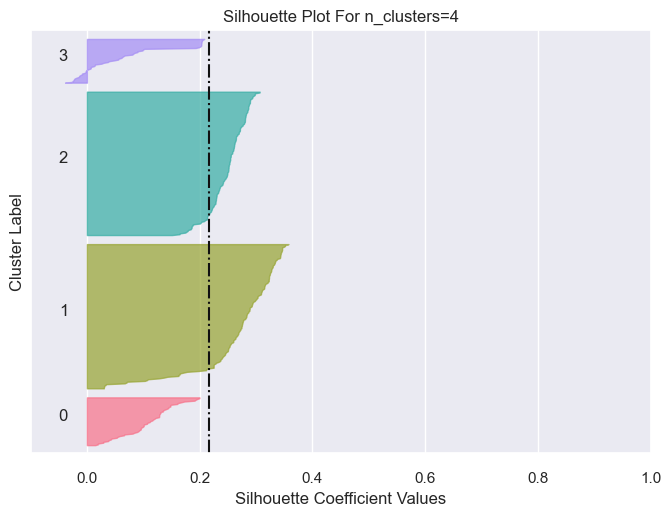

k=5
For n_clusters=5 The average silhouette score is 0.2404563365257746


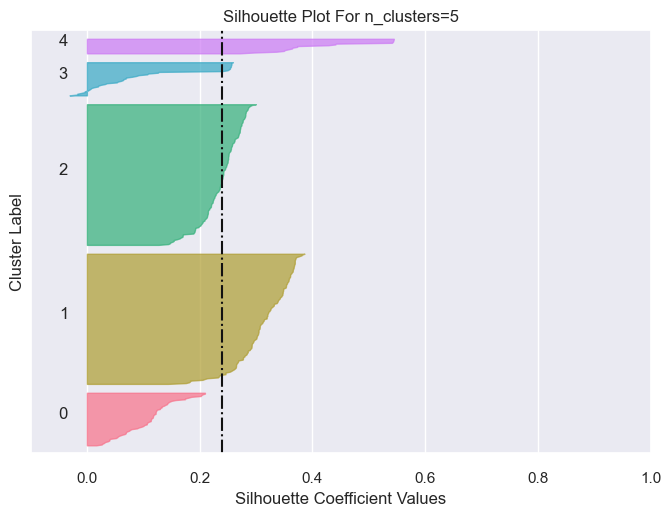

k=6
For n_clusters=6 The average silhouette score is 0.22786020186972944


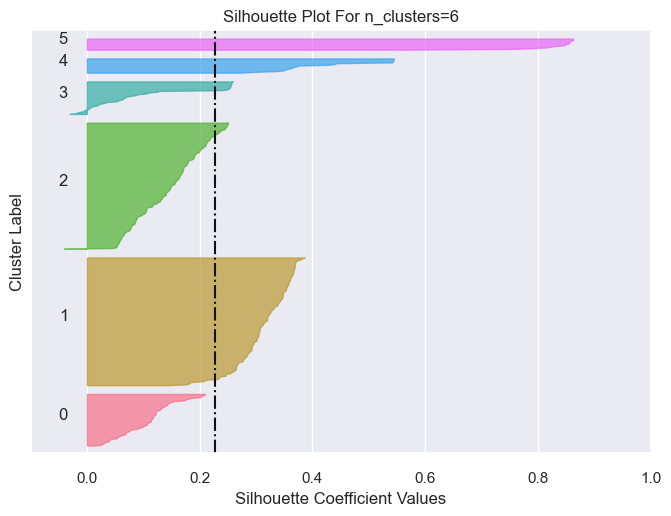

k=7
For n_clusters=7 The average silhouette score is 0.2083022256326111


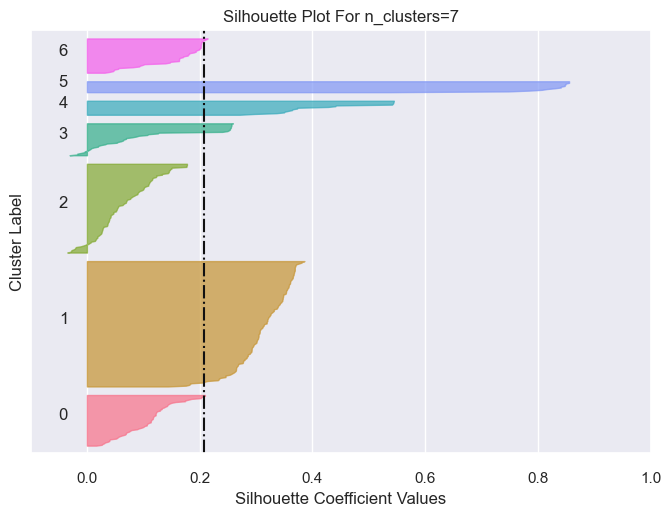

In [49]:
llm_high_modeler.show_silhouettes(3,8)

In [125]:
all_model = modeling.KMeansModel(kmeans_all, 4)
high_model = modeling.KMeansModel(kmeans_high, 4)

llm_all_model = modeling.KMeansModel(llm_all, 4)
llm_high_model = modeling.KMeansModel(llm_high, 3)

llm_all_no_outliers = pd.read_csv('../data/processed/no_outliers_llm_kmeans_all_data.csv')
llm_high_no_outliers = pd.read_csv('../data/processed/no_outliers_llm_kmeans_high_school.csv')

all_model.fit_predict()
high_model.fit_predict()

llm_all_model.fit_predict()
llm_high_model.fit_predict()

In [57]:
all_model.evaluate_model()

Davies Bouldin Score: 0.7367555589700681
Calinksi Score: 7169.814226910936
Silhouette Score: 0.46608928320110987


In [58]:
high_model.evaluate_model()

Davies Bouldin Score: 0.7912801625276478
Calinksi Score: 498.9880599297081
Silhouette Score: 0.4272400246241571


In [59]:
llm_all_model.evaluate_model()

Davies Bouldin Score: 1.3631899249798807
Calinksi Score: 2204.9442681128
Silhouette Score: 0.291112588123498


In [127]:
llm_high_model.evaluate_model()

Davies Bouldin Score: 1.4823347709653714
Calinksi Score: 227.05871750502533
Silhouette Score: 0.26771241504988624


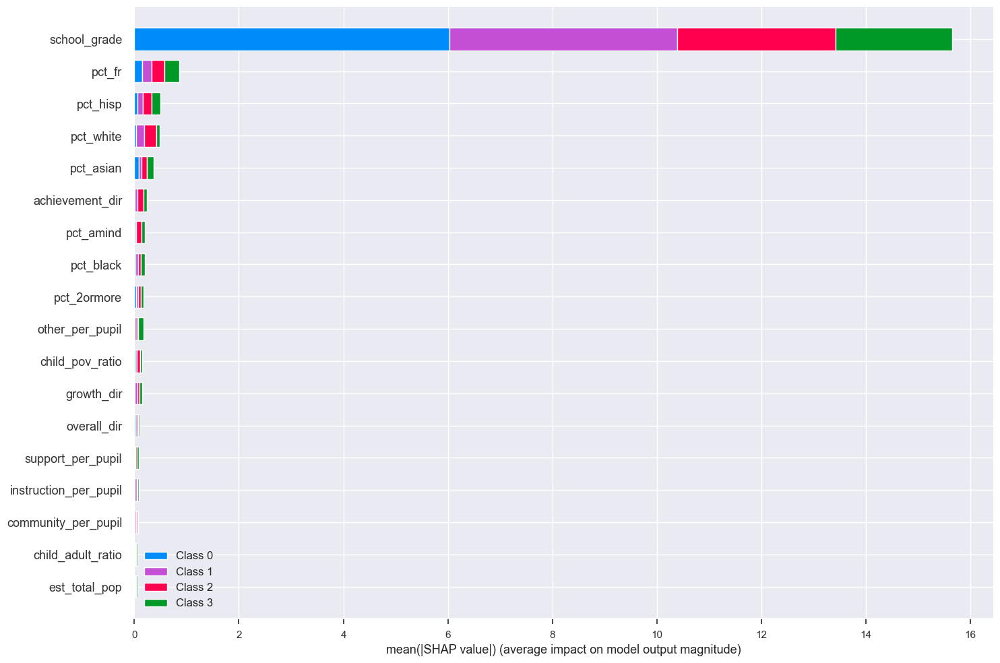

In [61]:
all_model.show_feature_importance()

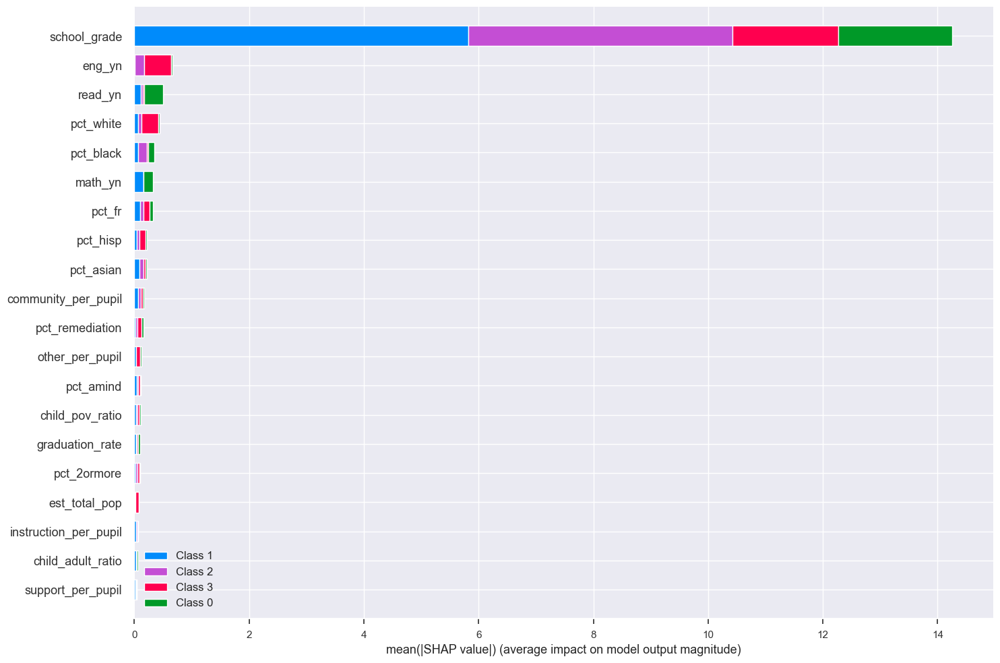

In [62]:
high_model.show_feature_importance()

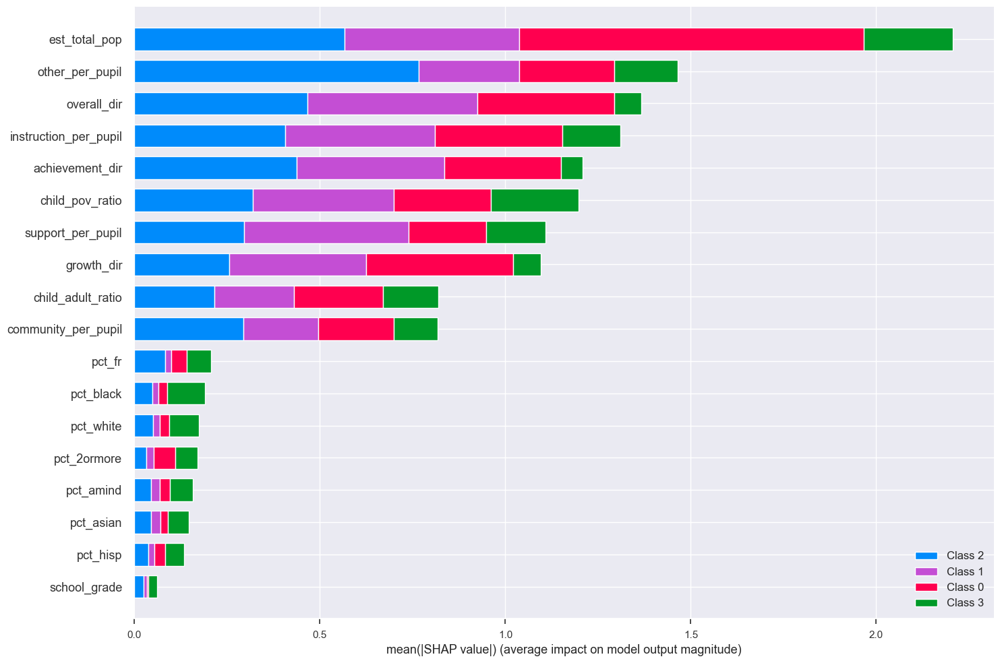

In [63]:
llm_all_model.show_feature_importance(llm_all_no_outliers.drop(['unique_id', 'year'], axis=1))

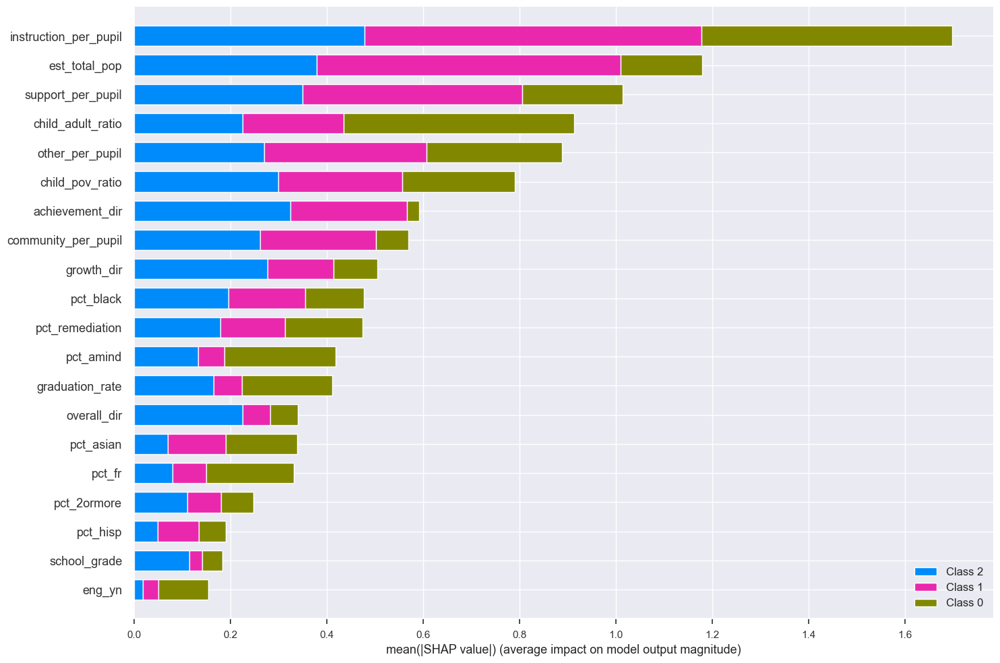

In [128]:
llm_high_model.show_feature_importance(llm_high_no_outliers.drop(['unique_id', 'year'], axis=1))

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.158        39.77%                     39.77%
1              1.899        10.55%                     50.32%


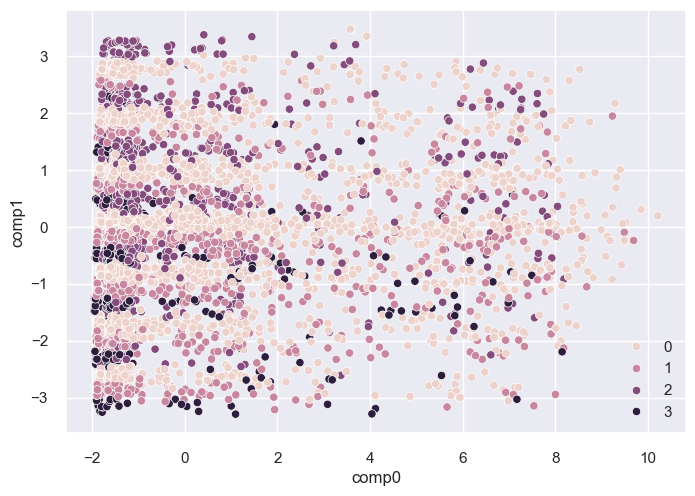

In [65]:
all_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              9.406        39.19%                     39.19%
1              2.906        12.11%                     51.30%


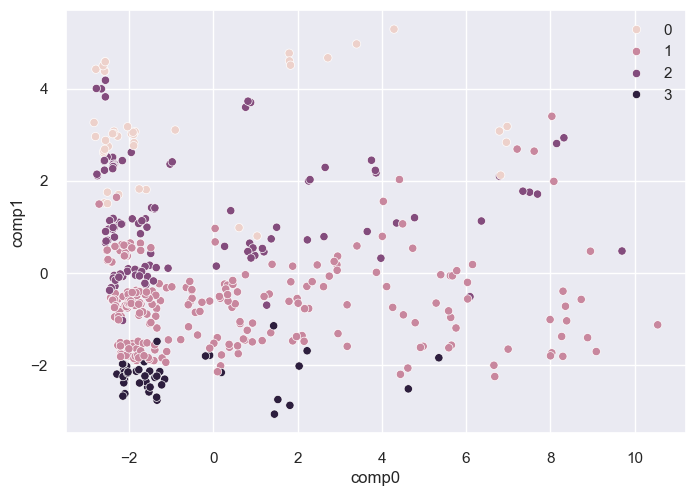

In [66]:
high_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            121.816        31.72%                     31.72%
1             31.982         8.33%                     40.05%


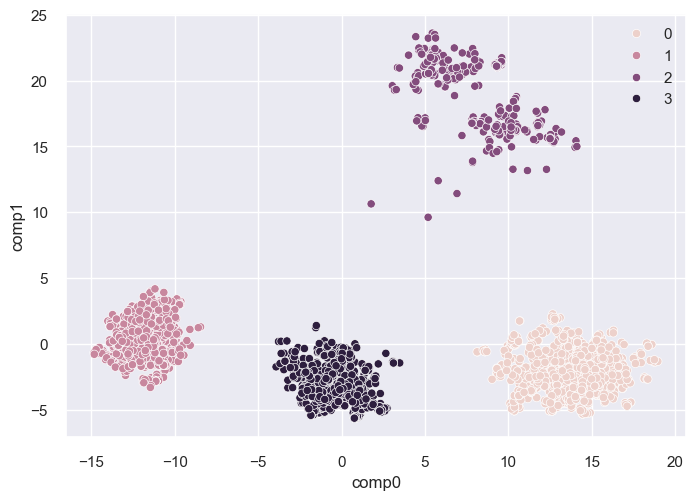

In [67]:
llm_all_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            127.976        33.33%                     33.33%
1             28.488         7.42%                     40.75%


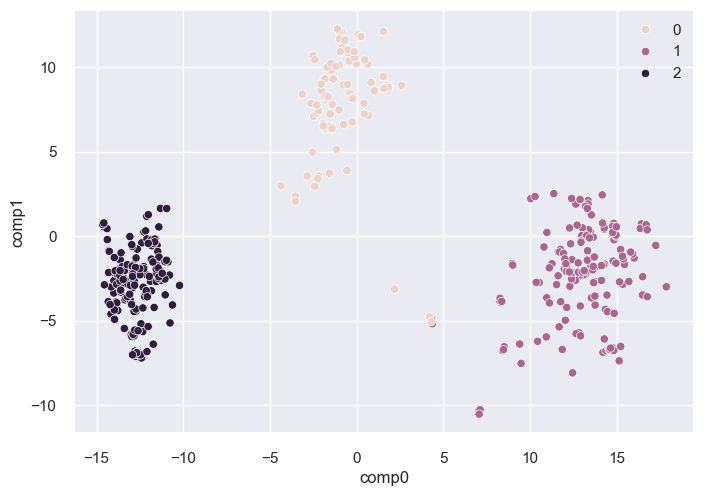

In [177]:
llm_high_model.plot_2d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.158        39.77%                     39.77%
1              1.899        10.55%                     50.32%
2              1.261         7.01%                     57.32%


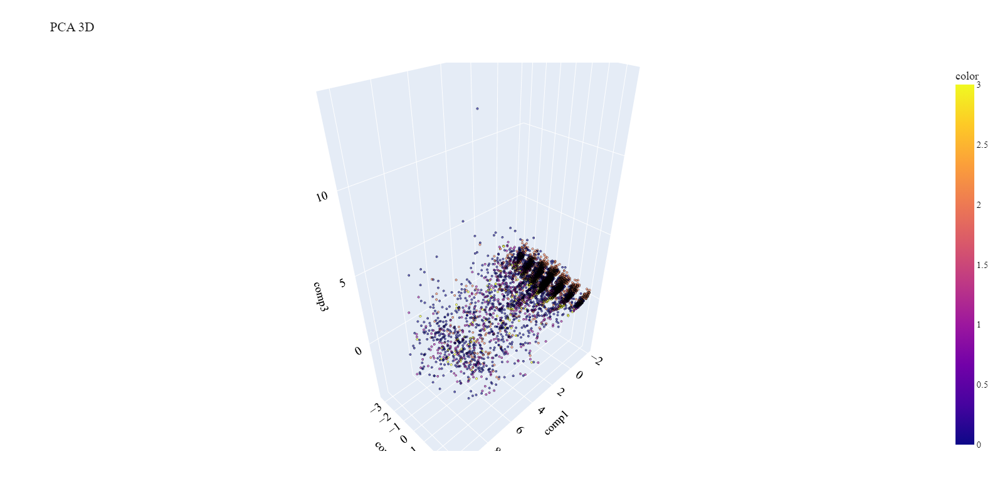

In [69]:
all_model.plot_3d()

In [178]:
high_model.plot_3d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              9.406        39.19%                     39.19%
1              2.906        12.11%                     51.30%
2              1.946         8.11%                     59.41%


Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            121.816        31.72%                     31.72%
1             31.982         8.33%                     40.05%
2             26.016         6.78%                     46.83%


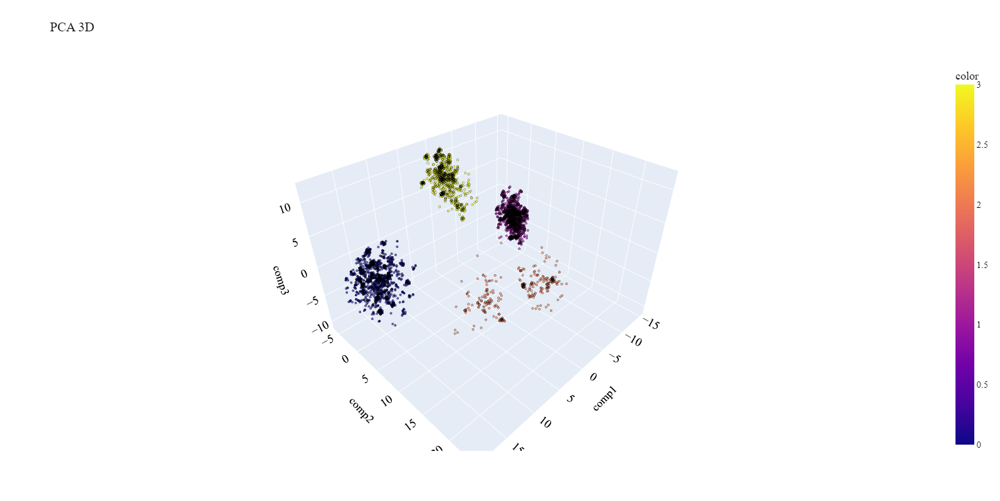

In [73]:
llm_all_model.plot_3d()

In [179]:
llm_high_model.plot_3d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0            127.976        33.33%                     33.33%
1             28.487         7.42%                     40.75%
2             22.931         5.97%                     46.72%


In [170]:
import pandas as pd

import importlib
import sys

# setting path
sys.path.append('..')
# importing
from src.models import modeling
importlib.reload(modeling);

kpro_all_selector = modeling.KPrototypesModelSelector(kprototypes_all)

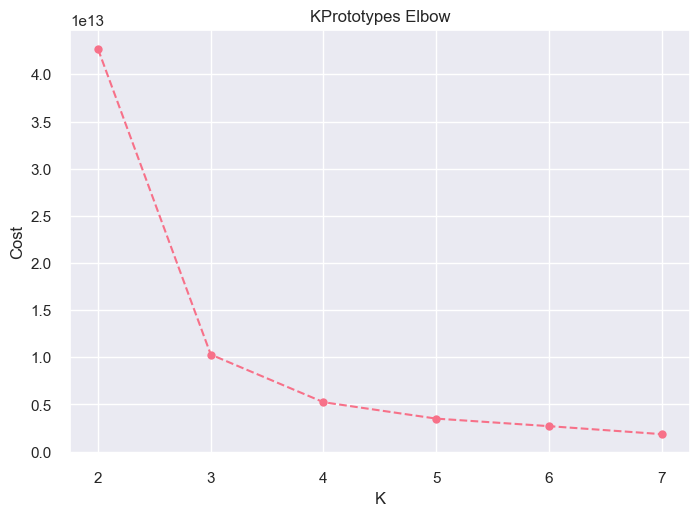

In [151]:
kpro_all_selector.show_elbow()

In [171]:
kpro_all_model = modeling.KPrototypesModel(kprototypes_all, 4)
kpro_all_model.fit_predict()

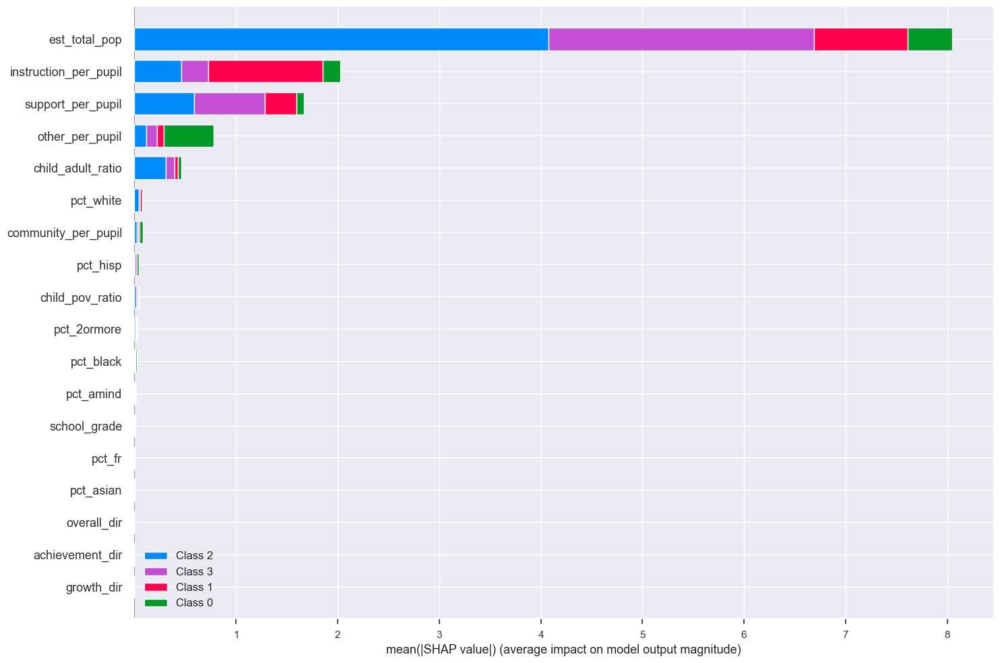

In [153]:
kpro_all_model.show_feature_importance()

In [155]:
kpro_high_selector = modeling.KPrototypesModelSelector(kprototypes_high)

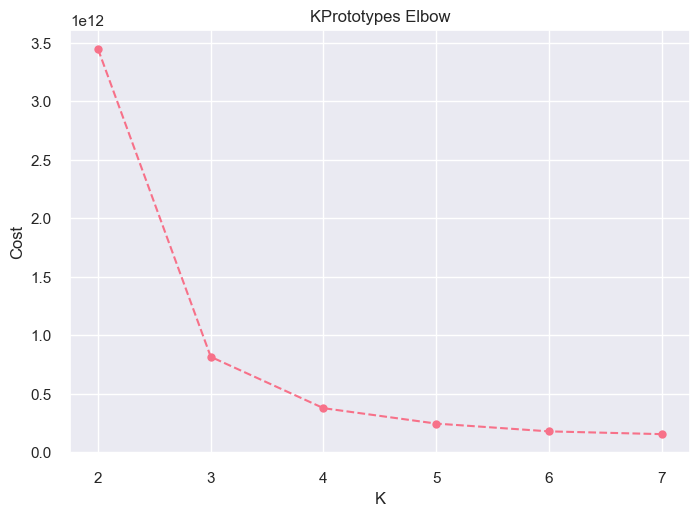

In [156]:
kpro_high_selector.show_elbow()

In [174]:
kpro_high_model = modeling.KPrototypesModel(kprototypes_high, 4)
kpro_high_model.fit_predict()

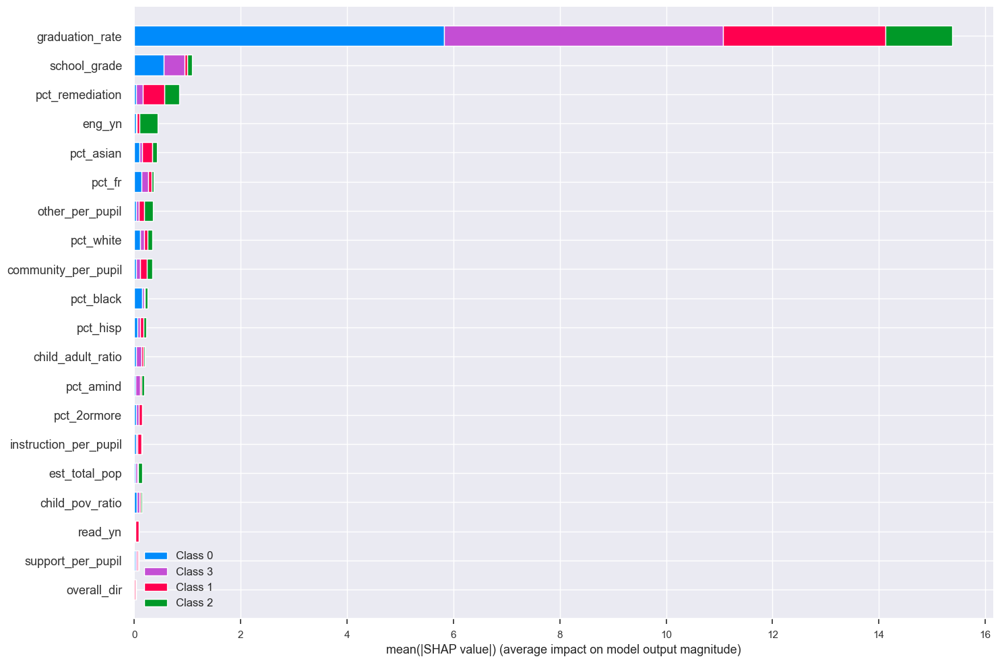

In [158]:
kpro_high_model.show_feature_importance()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.163        39.80%                     39.80%
1              1.903        10.57%                     50.37%


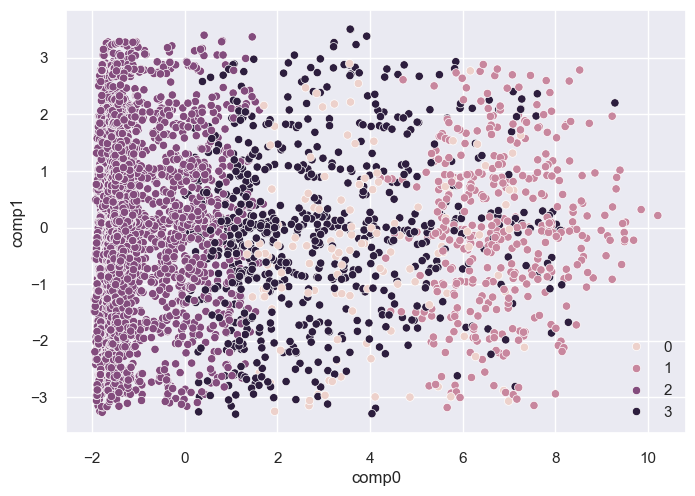

In [164]:
kpro_all_model.plot_2d()

In [172]:
kpro_all_model.plot_3d()

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.163        39.80%                     39.80%
1              1.903        10.57%                     50.37%
2              1.260         7.00%                     57.36%


Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.666        31.94%                     31.94%
1              4.127        17.19%                     49.14%


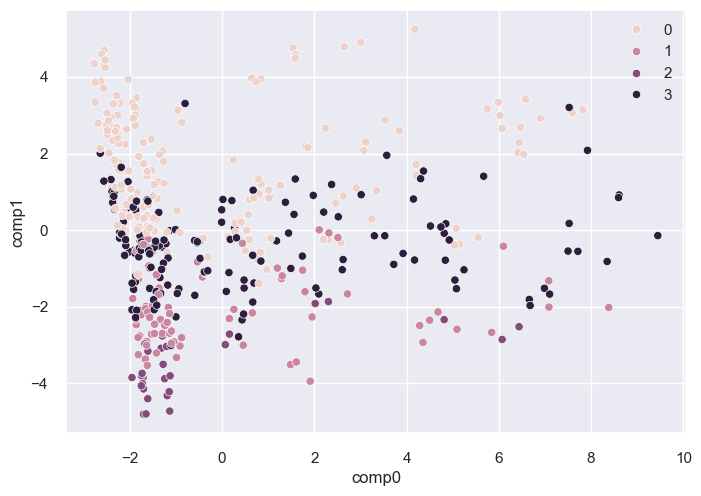

In [166]:
kpro_high_model.plot_2d()

In [176]:
kpro_high_model.plot_3d(size=5)

Explained Variance for Model           eigenvalue % of variance % of variance (cumulative)
component                                                    
0              7.666        31.94%                     31.94%
1              4.127        17.19%                     49.14%
2              1.950         8.13%                     57.26%
